<img src="http://www.paragon-events.com/wp-content/uploads/2016/03/choose-happiness-4.jpg">

# STA 141B Final Project

# Analysis   of   Happiness

### Shang Jiang :    915497630  
###  Jiahui Li     : 915544392 
### Songkai Xiao  : 915576357    

# MOTIVATION

Do you know which country is the happiest in the world?<br>

Do you know what's the secret of the happiness, nationally speaking?<br>

You want the answers? Follow us!

We are lucky enough to find a rank of global happiness in http://worldhappiness.report/, which motivates us to gain more insights into this interesting topic.  

Related Researches shows that happiness is increasingly important to both individuals and countries. Being happy is not just about feeling
good. Research shows that it also makes us healthier, more productive and nicer. Happiness is increasingly considered the proper measure of social progress and the goal of public policy.

And this project are motivated by these questions:

* Which countries and which regions have the highest happiness values?


* What elements does the happiness value of a country or a region depend on?  What’s the relationship between these elements and the happiness value?


* Can these countries be separated into different groups? Are these groups __distinct__ from each other? If yes, what's the __characteristics__ of these groups?

# ANALYSIS

# 1. Data

How to find variables contributing to happiness?

__Our strategy:__
1. Use a web scraping to get some terms related to happiness.
2. Combine it with our domain knowledge to delete some misleading terms.
3. Use research result to add some extra data.
4. Find data from the internet.
5. check data and clean data.

In [2]:
import pandas as pd
import numpy as np
import math
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotnine as gg
from scipy import stats, integrate
from mpl_toolkits.mplot3d import Axes3D
sns.set(color_codes=True)
%matplotlib inline
# matplotlib.style.use('ggplot')
matplotlib.rcParams['figure.figsize'] = (12,8)

import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
from plotly import __version__
import cufflinks as cf
from sklearn.preprocessing import scale
import warnings
warnings.filterwarnings('ignore')

from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler

import statsmodels.api as sm
from statsmodels.formula.api import ols
import scipy.stats as stats

import nltk
nltk.download("punkt")
nltk.download("averaged_perceptron_tagger")
nltk.download("brown")
nltk.download("wordnet")
nltk.download("stopwords")

import requests
import requests_ftp
import requests_cache
import lxml
import lxml.html as lx

from textblob import TextBlob
from nltk.corpus import stopwords
from nltk.corpus import wordnet
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud 
# plt.style.use('ggplot')

[nltk_data] Downloading package punkt to /Users/lijh/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/lijh/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package brown to /Users/lijh/nltk_data...
[nltk_data]   Package brown is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/lijh/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/lijh/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [5]:
hp15 = pd.read_csv("2015.csv")
hp16 = pd.read_csv("2016.csv")
hp17 = pd.read_csv("2017.csv")
raw = pd.read_csv("raw_data.csv")

In [6]:
hp15 = hp15.set_index('Country')
hp16 = hp16.set_index('Country')
hp17 = hp17.set_index('Country')
hp17 = hp17.rename(columns = {'Whisker.high':'Upper Confidence Interval','Whisker.low':'Lower Confidence Interval',
                              'Economy..GDP.per.Capita.':'Economy (GDP per Capita)',
                              'Health..Life.Expectancy.':'Health (Life Expectancy)',
                              'Trust..Government.Corruption.':'Trust (Government Corruption)',
                              'Dystopia.Residual':'Dystopia Residual'})
hp17 = hp17.join(hp16.Region)
raw['Happiness Score'] = raw['Life Ladder']

In [7]:
hpall = raw['Happiness Score'].dropna()
gdpall = raw['GDP per capita'].dropna()
socialall = raw['Social support'].dropna()
freedomall = raw ['Freedom to make life choices'].dropna()
healthyall = raw['Healthy life expectancy at birth'].dropna()
corruptionall = raw['Perceptions of corruption'].dropna()
generosityall = raw['Generosity'].dropna()

## __1.1 Variable Analysis:__

### 1.1.1.  Web Crawler:
We scrape the content from wiki (url: https://en.wikipedia.org/wiki/World_Happiness_Report)
And use a word cloud to analysis which factor mainly influence the happiness.



In [8]:
def wordnet_pos(tag):
    """Map a Brown POS tag to a WordNet POS tag."""
    
    table = {"N": wordnet.NOUN, "V": wordnet.VERB, "R": wordnet.ADV, "J": wordnet.ADJ}

    return table.get(tag[0], wordnet.NOUN)

def word_clear(text):
    blob = TextBlob(text)
    stopwords_ = stopwords.words("english")
    new_text = " ".join(w for w in blob.words if w.lower() not in stopwords_)
    blob = TextBlob(new_text)
    tags = [wordnet_pos(x[1]) for x in blob.pos_tags]
    new_text = " ".join(x.lemmatize(t) for x, t in zip(blob.words, tags))
    blob = TextBlob(new_text)
    return(blob)

def visulization(text,max_word=30):
    wordcloud = WordCloud(
        background_color= 'white',
        stopwords = stopwords.words("english"),
        scale= 10,
        max_words = max_word,
        max_font_size = 40,
    )
    wordcloud = wordcloud.generate(str(text))
    plt.figure(1,figsize=(12,12))
    plt.axis('off')
    plt.imshow(wordcloud) 
    
def web_craw(url,url_base):
    response = requests.get(url)
    response.raise_for_status()
    doc = response.text
    html = lx.fromstring(doc,base_url = url_base)
    html.make_links_absolute()
    links = html.xpath("//p")
    i = 0 
    text_ = [[]] * len(links)
    for t in links:
        text_[i] = t.text_content().lower()
        i = i + 1 
    text = ''.join(text_)
    #text = word_clear(text)
    return(text)

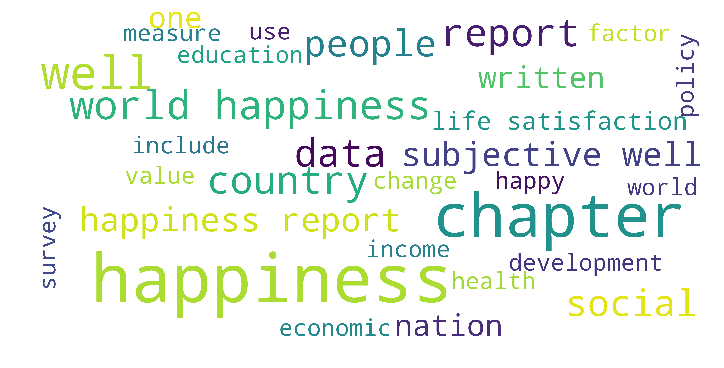

In [9]:
url = 'https://en.wikipedia.org/wiki/World_Happiness_Report'
url_base = 'https://en.wikipedia.org/'

text = web_craw(url,url_base)
visulization(word_clear(text),max_word=30)

### 1.1.2.	Domain knowledge

Using domain knowledge to delete some unrelated terms and we can see the new word cloud.
Which implies the economic, social, health, policy and other factors will influence the happiness level.

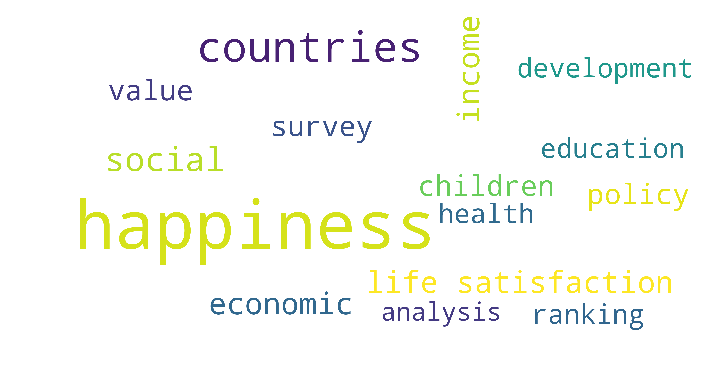

In [10]:
text_ = text.split()
text_ = [x.replace('chapter','') for x in text_]
text_ = [x.replace('written','') for x in text_]
text_ = [x.replace('report','') for x in text_]
text_ = [x.replace('change','') for x in text_]
text_ = [x.replace('world','') for x in text_]
text_ = [x.replace('nation','') for x in text_]
text_ = [x.replace('data','') for x in text_]
text_ = [x.replace('people','') for x in text_]
text_ = [x.replace('measure','') for x in text_]
text_ = [x.replace('one','') for x in text_]
text_ = [x.replace('include','') for x in text_]
text_ = [x.replace('use','') for x in text_]
text_ = [x.replace('finding','') for x in text_]
text_ = [x.replace('well','') for x in text_]
text_ = [x.replace('factor','') for x in text_]
text_ = [x.replace('subjective','') for x in text_]
text__ = ' '.join(text_)
visulization(text__,max_word=15)

### 1.1.3 Research results:
After reading some research papers related to happiness,, we decide to add two variables: __freedom__ and __extra money__ they have.

## 1.2 Data Source and Data Cleaning:

### 1.2.1.	What do we use to describe the factor and Where do we find our data and the data description?

* We use __GDP per capita__ to describe economic factor
    
    At constant  2017 international dollar prices are from the World Development Indicators http://databank.worldbank.org/data/reports.aspx?source=world-development-indicators#
      

* We use  __Healthy life expectancy__ to describe health factor
    
    Calculated by the authors based on data from the WHO, WDI, and statistics published in journal   articles.
    http://worldhappiness.report/


* We use __social factor__ to describe social factor 
    
    If we could have someone to count on in time of trouble
    http://worldhappiness.report/
    

* We use __Trust of Government__  to describe the policy factor
    
    Denoted by the corruption perception http://worldhappiness.report/
    

* Some __extra data__ source we would like to consider:

    __Freedom to make right choice__
    
    Describe people’s freedom or living pressure. http://worldhappiness.report/
    
    __Generosity__
    
    Describe people’s extra money and denoted by the donation of people
    http://worldhappiness.report/
    





### 1.2.2.  What is the problem of our data and what did we do to fix them?

   The problem is there are a lot of missing values and since we have plenty of data, we just drop them. Also, the price of GDP is not consistent, we use extra data from WDI to transparent them to a constant 2017 international dollar price.

# 2.Exploratory Data Analysis

## 2.1 Distribution of Variables

In order to have a general understanding of our variables, we show the distribution of every variables.

[Text(0,0.5,''), Text(0.5,0,''), Text(0.5,1,'Generosity')]

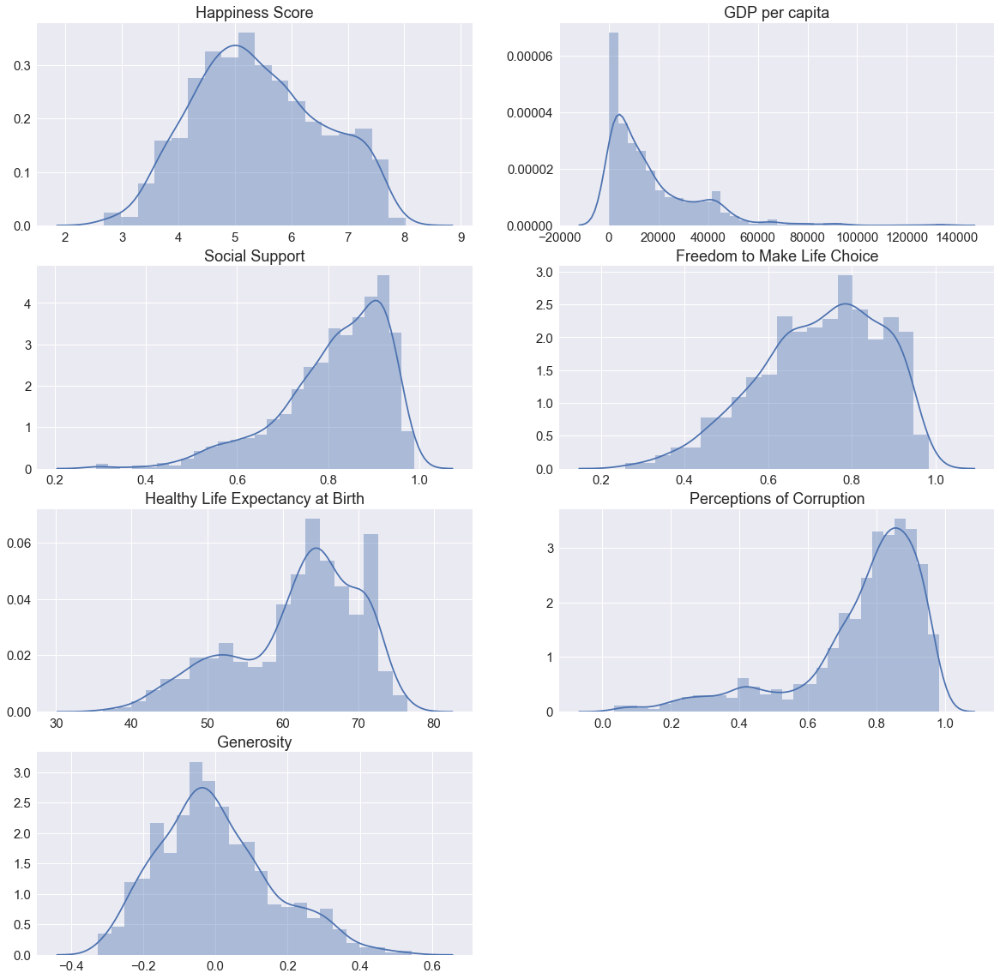

In [11]:
sns.set(rc={'figure.figsize':(20,20)})
sns.set(font_scale=1.5) 
plt.subplot(421)
ax = sns.distplot(hpall)
ax.set(title = "Happiness Score", xlabel = "", ylabel = "")
plt.subplot(422)
ax = sns.distplot(gdpall)
ax.set(title = "GDP per capita", xlabel = "", ylabel = "")
plt.subplot(423)
ax = sns.distplot(socialall)
ax.set(title = "Social Support", xlabel = "", ylabel = "")
plt.subplot(424)
ax = sns.distplot(freedomall)
ax.set(title = "Freedom to Make Life Choice", xlabel = "", ylabel = "")
plt.subplot(425)
ax = sns.distplot(healthyall)
ax.set(title = "Healthy Life Expectancy at Birth", xlabel = "", ylabel = "")
plt.subplot(426)
ax = sns.distplot(corruptionall)
ax.set(title = "Perceptions of Corruption", xlabel = "", ylabel = "")
plt.subplot(427)
ax = sns.distplot(generosityall)
ax.set(title = "Generosity", xlabel = "", ylabel = "")

* The happiness score is mainly concentrated between 3.5 to 7.5. Almost no people in a country think that they are extremely unhappy or happy.


* GDP is mainly concentrated between 0 to 40000. And it is severely right-skewed. 


* The social support is mainly concentrated between 0.7 to 1.0. People in lots of countries  are satisfied with their social support


* The Freedom to make like choices is concentrated in 0.5 to 0.9. People in most countries think they have freedom to make life choice, but still in a few countries, people do not think they have enough freedom to make life choice.


* For the healthy life expectancy, there are almost three peaks, one is at 53, one is at 64, on is at 72. 


* The perceptions of corruption is mainly concentrated between 0.6 to 1.0. The higher the perceptions of corruption is, the worse the trust of government. So, people in most countries are not trust their government so much.

Since GDP is severely right-skewed, which will effect our analysis, so we make transformation, taking log, on it.

In [12]:
raw['Log GDP per capita']= [math.log(x) for x in raw['GDP per capita']]
gdpall = raw['Log GDP per capita'].dropna()

## 2.2 Distribution of Variables VS Year

In order to figure out if the variables have large difference among different years, we plot the distribution of variables vs years.

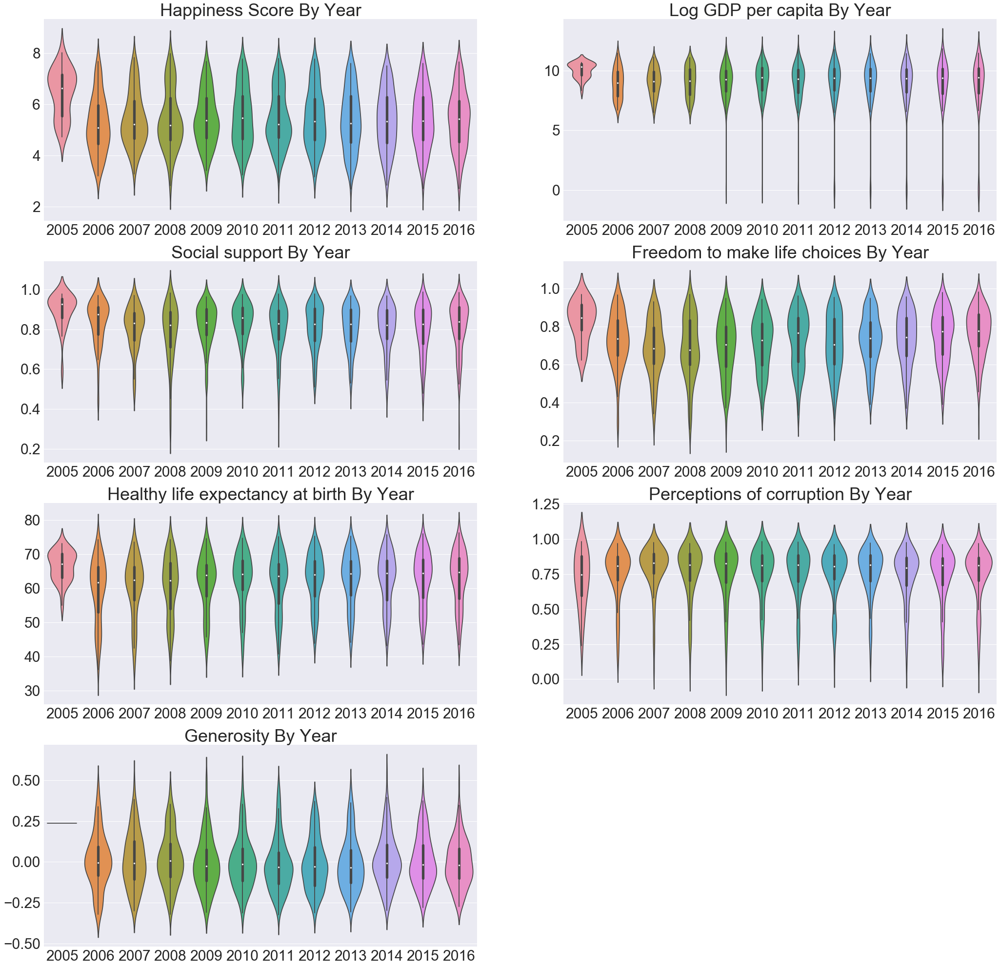

In [13]:
sns.set(rc={'figure.figsize':(35,35)})
sns.set(font_scale=3) 

plt.subplot(421)
ax = sns.violinplot(x="year", y="Happiness Score", data=raw)
ax.set(title = "Happiness Score By Year", xlabel = "", ylabel = "")
ax.set_xticklabels(ax.get_xticklabels(), rotation = 0)
ax.tick_params(labelsize=30)
plt.subplot(422)
ax = sns.violinplot(x="year", y="Log GDP per capita", data=raw)
ax.set(title = "Log GDP per capita By Year", xlabel = "", ylabel = "")
ax.set_xticklabels(ax.get_xticklabels(), rotation = 0)
ax.tick_params(labelsize=30)
plt.subplot(423) 
ax = sns.violinplot(x="year", y="Social support", data=raw)
ax.set(title = "Social support By Year", xlabel = "", ylabel = "")
ax.set_xticklabels(ax.get_xticklabels(), rotation = 0)
ax.tick_params(labelsize=30)
plt.subplot(424)
ax = sns.violinplot(x="year", y="Freedom to make life choices", data=raw)
ax.set(title = "Freedom to make life choices By Year", xlabel = "", ylabel = "")
ax.set_xticklabels(ax.get_xticklabels(), rotation = 0)
ax.tick_params(labelsize=30)
plt.subplot(425)
ax = sns.violinplot(x="year", y="Healthy life expectancy at birth", data=raw)
ax.set(title = "Healthy life expectancy at birth By Year", xlabel = "", ylabel = "")
ax.set_xticklabels(ax.get_xticklabels(), rotation = 0)
ax.tick_params(labelsize=30)
plt.subplot(426) 
ax = sns.violinplot(x="year", y="Perceptions of corruption", data=raw)
ax.set(title = "Perceptions of corruption By Year", xlabel = "", ylabel = "")
ax.set_xticklabels(ax.get_xticklabels(), rotation = 0)
ax.tick_params(labelsize=30)
plt.subplot(427) 
ax = sns.violinplot(x="year", y="Generosity", data=raw)
ax.set(title = "Generosity By Year", xlabel = "", ylabel = "")
ax.set_xticklabels(ax.get_xticklabels(), rotation = 0)
ax.tick_params(labelsize=30)

* From the plot, we find that the distribution of variables do not have large difference with year, except year 2005.


 we find that the data of 2005 is abnormal, the distribution of which is much different from those of other years, so we take a careful look on the data of year 2015, to check if they should remain in the data we use to the further analysis.

In [14]:
pd.DataFrame(raw.year.value_counts()).T

,2011,2014,2015,2012,2016,2013,2010,2009,2008,2007,2006,2005
year,146,145,143,142,141,137,124,114,110,102,89,27


The data of 2005 only record 27 countries, which is much less than the othe years, so we guess the abnormal distribution is because the size of data is smaller, not because of other experimental or recording errors.


We plot the distribution of every variable of 2005 with that of whole data to have a further check.

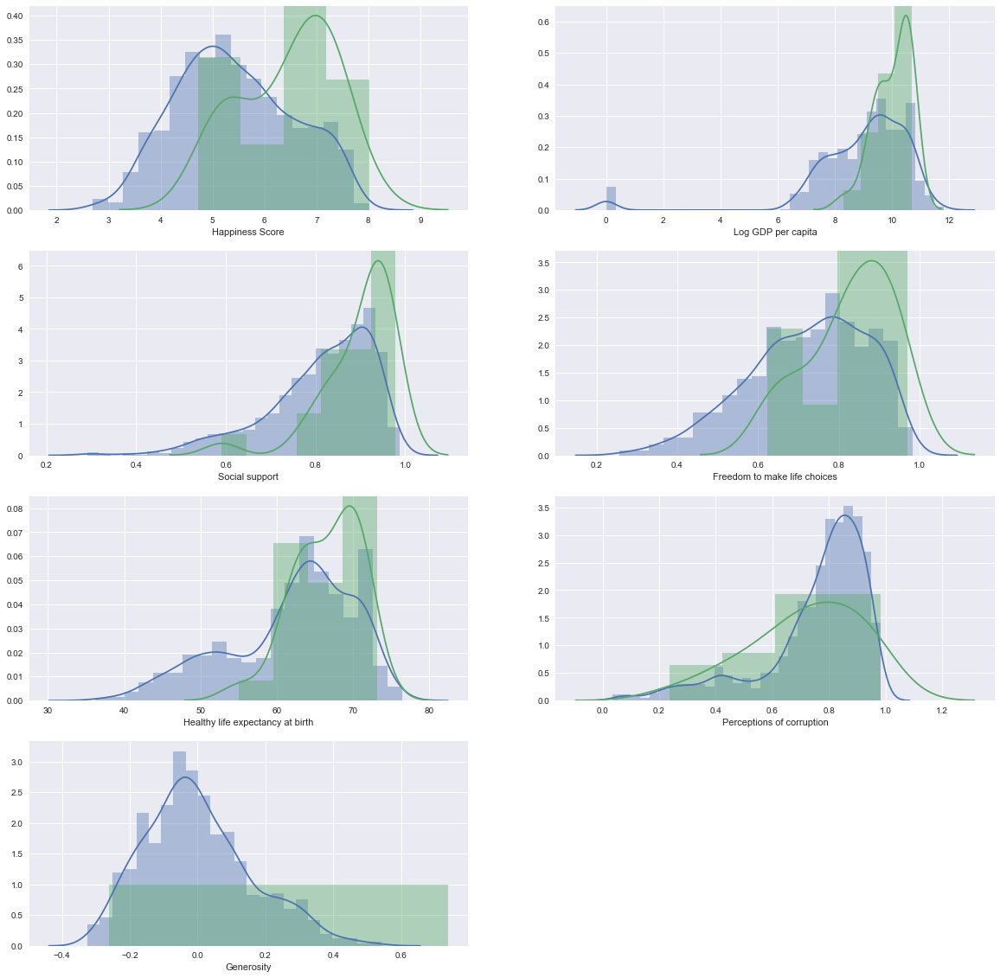

In [15]:
data05 = raw[raw.year==2005]

sns.set(rc={'figure.figsize':(20,20)})
plt.subplot(421)
ax = sns.distplot(hpall)
ax = sns.distplot(data05['Happiness Score'].dropna())
plt.subplot(422)
ax = sns.distplot(gdpall)
ax = sns.distplot(data05['Log GDP per capita'].dropna())
plt.subplot(423)
ax = sns.distplot(socialall)
ax = sns.distplot(data05['Social support'])
plt.subplot(424)
ax = sns.distplot(freedomall)
ax = sns.distplot(data05['Freedom to make life choices'].dropna())
plt.subplot(425)
ax = sns.distplot(healthyall)
ax = sns.distplot(data05['Healthy life expectancy at birth'].dropna())
plt.subplot(426)
ax = sns.distplot(corruptionall)
ax = sns.distplot(data05['Perceptions of corruption'].dropna())
plt.subplot(427)
ax = sns.distplot(generosityall)
ax = sns.distplot(data05['Generosity'].dropna())

* From the plot, we can find the distribution of data of 2005 year is similar to the higher part of the distribution of whole data. When we take a closer look of the data, we find the countries included in 2005 data are mainly developed country, maybe because the report only collect the happiness score of some developed countries in the first years.

## 2.3 Distribution of Variables VS Region

In order to figure out if the variables have large difference among different regions, we plot the distribution of variables vs regions.

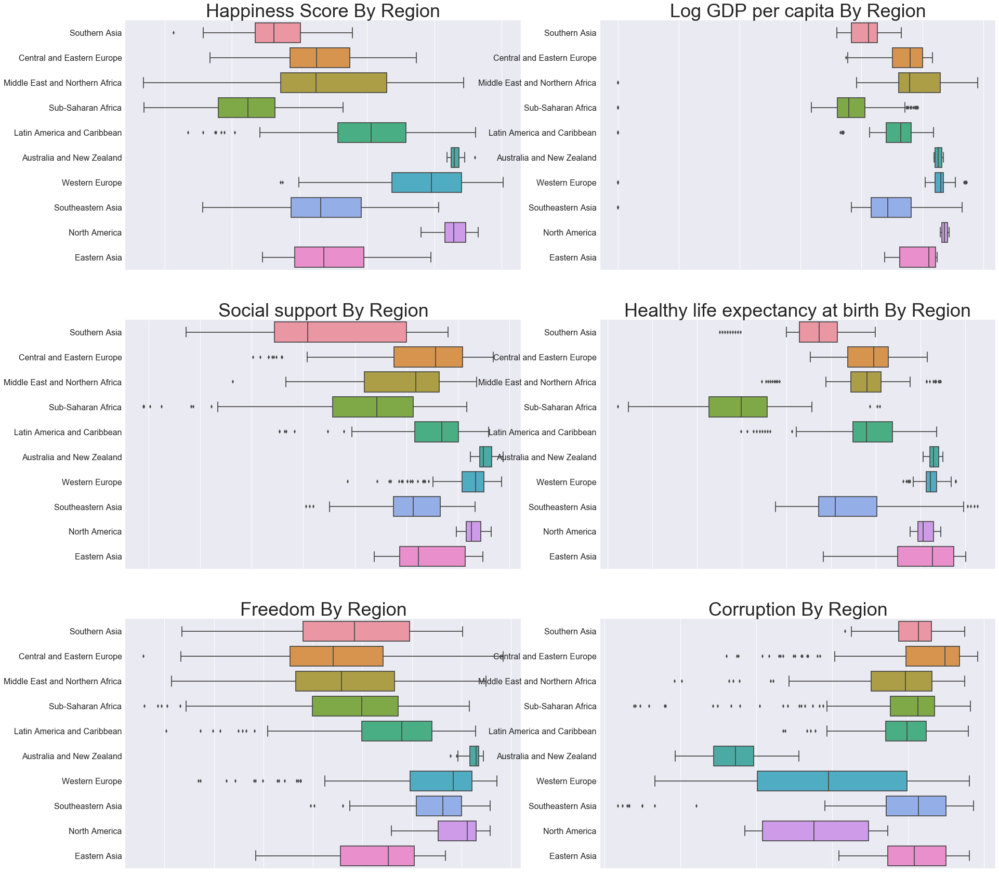

In [16]:
raw.rename(columns={'country':'Country'},inplace =True)
raw = raw.set_index('Country')
raw = raw.join(hp15.Region)

sns.set(rc={'figure.figsize':(30,30)})

plt.subplot(321)
sns.set(font_scale=3) 
ax = sns.boxplot(x = 'Happiness Score', y = 'Region',data=raw)        #draw the barplot
ax.set(title = "Happiness Score By Region", xlabel = "", ylabel = "")
ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
ax.tick_params(labelsize=16) 

plt.subplot(322)
sns.set(font_scale=3) 
ax = sns.boxplot(x = 'Log GDP per capita', y = 'Region',data=raw)        #draw the barplot
ax.set(title = "Log GDP per capita By Region", xlabel = "", ylabel = "")
ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
ax.tick_params(labelsize=16) 

plt.subplot(323)
sns.set(font_scale=3) 
ax = sns.boxplot(x = 'Social support', y = 'Region',data=raw)        #draw the barplot
ax.set(title = "Social support By Region", xlabel = "", ylabel = "")
ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
ax.tick_params(labelsize=16) 

plt.subplot(324)
sns.set(font_scale=3) 
ax = sns.boxplot(x = 'Healthy life expectancy at birth', y = 'Region',data=raw)        #draw the barplot
ax.set(title = "Healthy life expectancy at birth By Region", xlabel = "", ylabel = "")
ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
ax.tick_params(labelsize=16) 

plt.subplot(325)
sns.set(font_scale=3) 
ax = sns.boxplot(x = 'Freedom to make life choices', y = 'Region',data=raw)        #draw the barplot
ax.set(title = "Freedom By Region", xlabel = "", ylabel = "")
ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
ax.tick_params(labelsize=16)

plt.subplot(326)
sns.set(font_scale=3) 
ax = sns.boxplot(x = 'Perceptions of corruption', y = 'Region',data=raw)        #draw the barplot
ax.set(title = "Corruption By Region", xlabel = "", ylabel = "")
ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
ax.tick_params(labelsize=16)


* Every variables differ much with region.


* Australia and New Zealand, Western Europe and North America have large happiness score, large GDP,large social support, large healthy life expectancy, large freedom and small perception of corruption.


* Sub-Saharan Africa and Southern Asia have small happiness score, small GDP, small social support, small healthy life expectancy. But the freedom of these two region is not very small.

## 2.4 Relation between Happiness  with Other Variables

In order to figure out the relation between happiness score with other varaibles, we first plot the world distribution of variables to compare their distributions.

In [17]:
def drawworld(df, name, year):
    data = dict(type = 'choropleth', 
    locations = df.index,
    locationmode = 'country names',
    colorscale = [[0,"rgb(153, 51, 51)"],[0.5,"rgb(240, 240, 240)"],[1,"rgb(255, 153, 204)"]],
    z = df[name], 
    text = df.index,
    colorbar = {'title':str(name)})
    layout = dict(title = 'World '+str(name) + ' in ' +str(year), 
                  geo = dict(showframe = False, projection = {'type': 'Mercator'}))
    choromap3 = go.Figure(data = [data], layout=layout)
    iplot(choromap3)

In [46]:
data16 = raw[raw.year ==2016]
drawworld(hp16,'Happiness Score',2016)

* This is the interactive plot(using the cursor you can get the exact value of every country). (We recommend you to read our __html-version__ report([Analysis of Happiness](https://ucdsta141b.github.io/sta141b-proj--jiahui-li-shan-jiang-songkai-xiao/141B_final_project.html)), since the github can't support interactive plots well.)

In [47]:
drawworld(data16,'Log GDP per capita',2016)

In [48]:
drawworld(data16,'Social support',2016)

* From the world distribution, we can find that the distributions of Happiness Score, GDP, Social Support, Healthy life expectancy are similar, so obviously, they have not weak correaltion between happiness score with GDP, Social Support and Healthy life expectancy. 

In [21]:
data16_new=data16.iloc[:,:-1].dropna()
data16_new_hp = data16_new['Happiness Score']
data = pd.DataFrame(scale(data16_new),index=data16_new.index, columns= data16_new.columns)
data['Happiness Score'] = data16_new_hp
data = data.sort_values(['Happiness Score'],ascending=True)


cf.go_offline()
data[['Happiness Score','Log GDP per capita','Social support','Healthy life expectancy at birth']].iplot(kind='spread')

* This is the interactive plot(using the cursor you can get the exact value of every country). (We recommend you to read our __html-version__ report([Analysis of Happiness](https://ucdsta141b.github.io/sta141b-proj--jiahui-li-shan-jiang-songkai-xiao/141B_final_project.html)), since the github can't support interactive plots well.)

In [22]:
cf.go_offline()
data[['Happiness Score','Freedom to make life choices','Generosity']].iplot(kind='spread')

In [23]:
cf.go_offline()
data[['Happiness Score','Perceptions of corruption']].iplot(kind='spread')

* GDP, Social Support, Healthy life expectancy are incresing as happiness score increasing, so we think these three variables have strong positive relationship with happiness score.


* Freedom and Generosity are increasing as happiness score too, but not so significant, so we think these two variables have moderate positive realtionship with happiness score.


* Perceptions of corruption are decreasing as happiness score when the happiness score is high, so we think this variable has negative relationship with happiness score.

# 3.Modeling:
## 3.1.Visualization of Relationship

In [24]:
model_data = pd.read_csv('final_model_data.csv')
model_data = model_data.dropna()
pair = model_data[['Life Ladder', 'Log GDP per capita','Social support', 'Healthy life expectancy at birth',
       'Freedom to make life choices','Perceptions of corruption']]

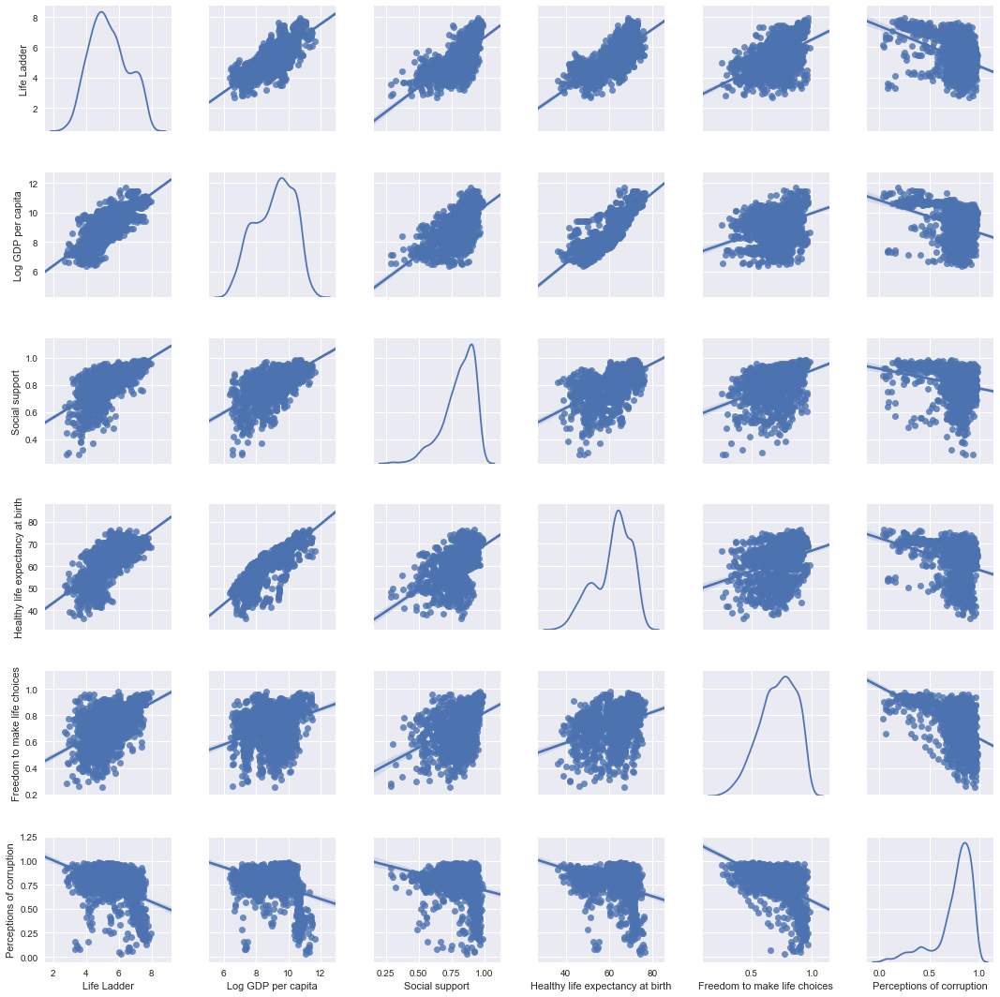

In [25]:
sns.set(rc={'figure.figsize':(10,10)})
sns.pairplot(pair,kind="reg",diag_kind="kde")

* The pairwise plot shows there is significant linear relationship and thus we fit a linear regression mode.

## 3.2 Modeling

In [26]:
y = pd.DataFrame(model_data['Life Ladder'])
x = pd.DataFrame(model_data.iloc[0:,3:9])
x = sm.add_constant(x)
x= x[['const', 'Log GDP per capita', 'Social support', 'Healthy life expectancy at birth', 'Freedom to make life choices',
        'Perceptions of corruption']]
model = sm.OLS(y, x).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            Life Ladder   R-squared:                       0.728
Model:                            OLS   Adj. R-squared:                  0.727
Method:                 Least Squares   F-statistic:                     666.5
Date:                Sun, 18 Mar 2018   Prob (F-statistic):               0.00
Time:                        22:45:16   Log-Likelihood:                -1116.4
No. Observations:                1249   AIC:                             2245.
Df Residuals:                    1243   BIC:                             2276.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
const                               -1.6485      0.206     -8.013      0.000      -2.052      -1.245
Log GDP per capita                   0.3120      0.030     10.556      0.000       0.254       0.370
Social support                       2.4001      0.196     12.227      0.000       2.015       2.785
Healthy life expectancy at birth     0.0300      0.004      7.985      0.000       0.023       0.037
Freedom to make life choices         1.2781      0.141      9.049      0.000       1.001       1.555
Perceptions of corruption           -0.6865      0.107     -6.405      0.000      -0.897      -0.476
==============================================================================
Omnibus:                       12.893   Durbin-Watson:                   0.621
Prob(Omnibus):                  0.002   Jarque-Bera (JB):               15.001
Skew:                          -0.170   Prob(JB):                     0.000553
Kurtosis:                       3.416   Cond. No.                         889.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

* The R-squared of the model is 0.728. The model is relatively reasonable.


* P-value of all the parameters are zero, implies it is very significant. and at almost the same importance.


* For log(GDP), social support, healthy life expectancy, and freedom to make choice, the parameters is positive which shows they are positively related.


* For perceptions of corruption, the parameters is negative which shows they are negatively related.

## 3.3	Model diagnosis

Text(0.5,1,'Residual plot')

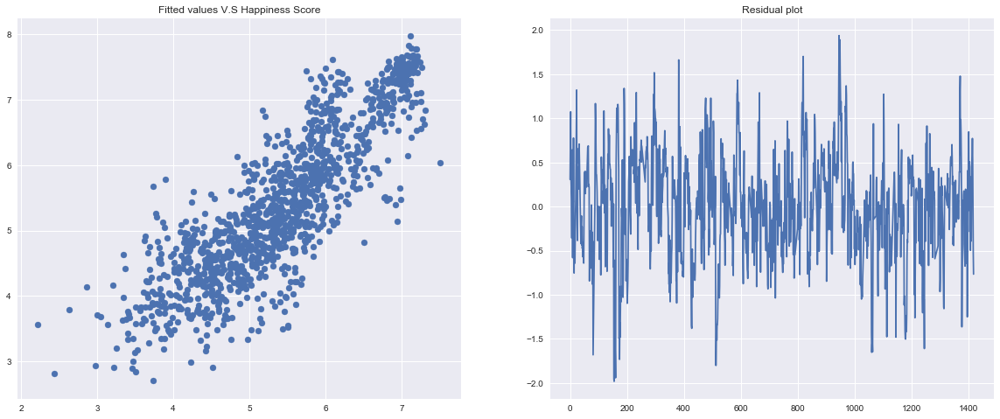

In [27]:
plt.figure(figsize=(20,8)) 
plt.subplot(121)
plt.scatter(model.fittedvalues,y['Life Ladder'],)
plt.title('Fitted values V.S Happiness Score')

plt.subplot(122)
plt.plot(model.resid)
plt.title('Residual plot')

* From the fitted value vs happiness score, the points spread around the line y = x, which shows that our model is appropriate.


* From the residual plot, the points are randomly and symmetrically around zero and with a constant variance, which shows that the assumptions of our model are satisfied.

# 4.Clustering

From the regreesion result, it appears these variables we choose(i.e __Log GDP per capita, Social support, Healthy life expectancy at birth, Freedom to make life choices, Perception of corruption__)  contribute greatly to the happiness score.

The following question comes naturally: 

(i) _Can these countries be separated into different groups? Are these groups __distinct__ from each other? _ 

(ii) _If yes, what's the __characteristics__ of these groups?_

Now, the method _ __K-Means Clustering__ _ plays an important role to answer these questions.

## 4.1 Data Aggregation

Since some variables of some countries in our data are missing for some reasons (not recorded, not covered, etc.). But we still want to fully utilize these imcomplete data, here we get the mean of each variable of each country given the data we have; and take the mean as the primary index of these variables.

In [28]:
data = pd.read_csv('final_model_data.csv')
data.set_index('country', inplace = True)
data.dropna(inplace = True)

country_index = data[['Log GDP per capita', 'Social support','Healthy life expectancy at birth', 'Freedom to make life choices',
       'Perceptions of corruption']]

country_index_year_average = country_index.groupby('country').agg(np.mean)

X = country_index_year_average
X.shape

(155, 5)

In [29]:
data.columns

Index(['year', 'Life Ladder', 'Log GDP per capita', 'Social support',
       'Healthy life expectancy at birth', 'Freedom to make life choices',
       'Generosity', 'Perceptions of corruption'],
      dtype='object')

In [30]:
X.head()

,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Perceptions of corruption
country,,,,,
Afghanistan,7.447978,0.520064,48.727537,0.557993,0.812616
Albania,9.172559,0.732704,67.999568,0.612438,0.857864
Algeria,9.481694,0.824816,63.891903,0.558112,0.664049
Angola,8.816016,0.737973,44.572942,0.455957,0.867018
Argentina,9.658498,0.904571,66.336436,0.707794,0.848656


## 4.2 Data Scaling

Because the _K-means Clustering_ method is scale-sensitive (the algorithm it use calculates the "distances" between variables and thus the different scales are influential!), we should __standardize__ the data first.

In [31]:
std_data = pd.DataFrame(scale(X),index=X.index, columns= X.columns)
std_data.head()

,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Perceptions of corruption
country,,,,,
Afghanistan,-1.383230,-2.433164,-1.438294,-1.177814,0.346557
Albania,0.024501,-0.607026,0.811286,-0.772498,0.595116
Algeria,0.276840,0.184022,0.331807,-1.176925,-0.469563
Angola,-0.266536,-0.561774,-1.923250,-1.937423,0.645401
Argentina,0.421160,0.868958,0.617152,-0.062620,0.544534


## 4.3 Clustering

Now, we are ready to cluster!

Based on the visualization and regression result, we decide to choose __three clusters__. and '__k-means++__' to select initial cluster centers for k-mean clustering in a smart way to speed up convergence.

In [32]:
kmeans = KMeans(init='k-means++', n_clusters=3, n_init=10, random_state=669)
kmeans.fit(std_data)
std_data['cluster'] = kmeans.fit_predict(std_data)
std_data.head()

,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Perceptions of corruption,cluster
country,,,,,,
Afghanistan,-1.383230,-2.433164,-1.438294,-1.177814,0.346557,0
Albania,0.024501,-0.607026,0.811286,-0.772498,0.595116,1
Algeria,0.276840,0.184022,0.331807,-1.176925,-0.469563,1
Angola,-0.266536,-0.561774,-1.923250,-1.937423,0.645401,0
Argentina,0.421160,0.868958,0.617152,-0.062620,0.544534,1


In [33]:
std_data.tail()

,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Perceptions of corruption,cluster
country,,,,,,
Venezuela,0.468382,1.018980,0.365033,-0.363368,0.214688,1
Vietnam,-0.571165,0.154136,0.487111,1.145390,0.175085,1
Yemen,-0.759764,-0.975924,-0.891941,-0.584356,0.459840,0
Zambia,-0.866873,-0.491032,-1.407057,0.191078,0.503226,0
Zimbabwe,-1.479496,0.116254,-2.025435,-1.252868,0.600748,0


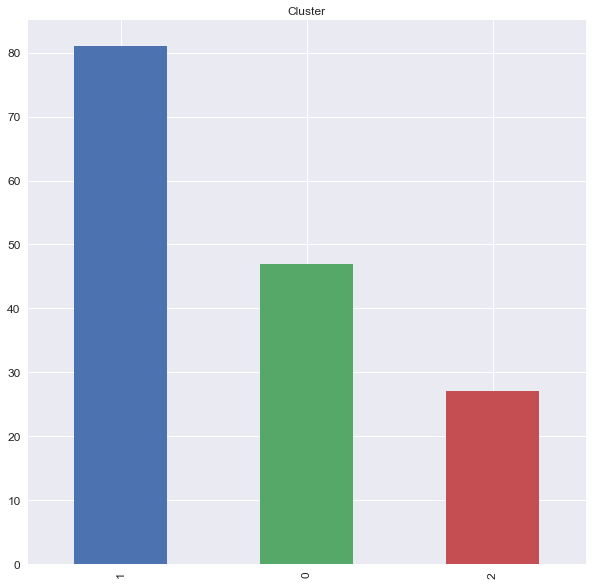

In [34]:
std_data.cluster.value_counts().plot.bar(fontsize = 12, title = 'Cluster', figsize = (10,10))

## 4.4 Cluster Visualization Using PCA

Above we get the clustering results. Most countries belong to Cluster1, and fewest countries belong to Cluster0.

But it's still hard to see the results clearly since they have too many variables(columns). Fortunately, we can take advantage of ___PCA___ to visualize the clustering results.

In [35]:
pca = PCA(n_components=3)
pc_X = pca.fit_transform(std_data) #PCA
print(pc_X.shape)
print(pca.explained_variance_ratio_)
print(pca.components_)
PC_X_df = pd.DataFrame(pc_X,columns= ['PCA1','PCA2','PCA3'],index=X.index)
PC_X_df.head()

(155, 3)
[0.62064954 0.18024456 0.10262687]
[[-0.48929468 -0.4474331  -0.4629548  -0.36202601  0.31412786 -0.34106898]
 [-0.28163003 -0.22452961 -0.32429493  0.53854574 -0.68619553 -0.06486882]
 [ 0.19060097 -0.46224366  0.27618917 -0.60676983 -0.54332872  0.10171473]]


,PCA1,PCA2,PCA3
country,,,
Afghanistan,3.263673,0.586694,0.901606
Albania,0.306625,-0.966462,0.667841
Algeria,-0.136839,-0.546875,1.041719
Angola,2.473345,-0.604863,0.414008
Argentina,-0.730871,-0.929608,-0.395686


The first two principal components explain about 80% variability of the data; and the first three explain about __90%__. The first three components appear good enough.

In [36]:
PC_cluster = pd.concat([PC_X_df,std_data['cluster']],axis = 1)
PC_cluster.head()

,PCA1,PCA2,PCA3,cluster
country,,,,
Afghanistan,3.263673,0.586694,0.901606,0
Albania,0.306625,-0.966462,0.667841,1
Algeria,-0.136839,-0.546875,1.041719,1
Angola,2.473345,-0.604863,0.414008,0
Argentina,-0.730871,-0.929608,-0.395686,1


In [37]:
PC_cluster.PCA1['Norway'],PC_cluster.PCA2['Norway'] # the cordinate of Norway

(-3.460204450725418, 1.1253012436384977)

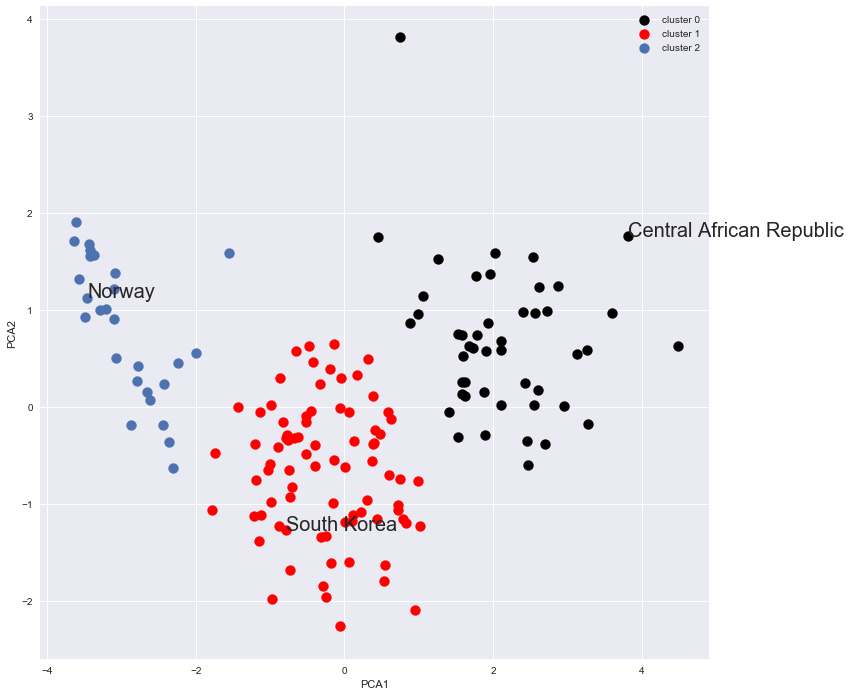

In [38]:
x, y = PC_cluster.PCA1, PC_cluster.PCA2

ind1,ind2,ind3 = PC_cluster.index[PC_cluster.cluster==0],PC_cluster.index[PC_cluster.cluster==1],PC_cluster.index[PC_cluster.cluster==2]
fig = plt.figure(figsize = (12,12))
ax = plt.subplot(111)  

ax.scatter(x[ind1], y[ind1], c='black',s = 100,label='cluster 0')  
ax.scatter(x[ind2], y[ind2], c='red',s = 100,label='cluster 1')
ax.scatter(x[ind3], y[ind3], c='b',s = 100,label='cluster 2')

plt.text(PC_cluster.PCA1['Norway'],PC_cluster.PCA2['Norway'],'Norway',fontsize = 20)
plt.text(PC_cluster.PCA1['Central African Republic'],PC_cluster.PCA2['Central African Republic'],'Central African Republic',fontsize = 20)
plt.text(PC_cluster.PCA1['South Korea'],PC_cluster.PCA2['South Korea'],'South Korea',fontsize = 20)

ax.set_ylabel('PCA2')
ax.set_xlabel('PCA1')
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels)

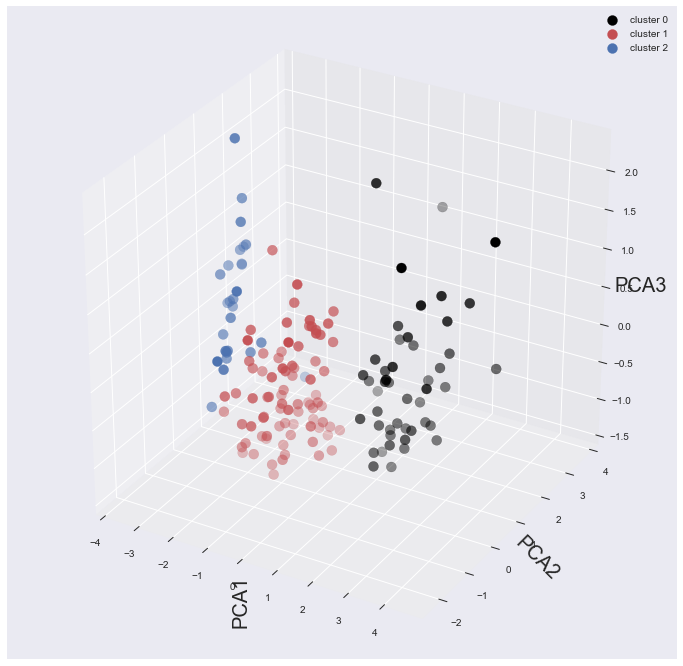

In [39]:
x, y, z = PC_cluster.PCA1, PC_cluster.PCA2, PC_cluster.PCA3
ind1,ind2,ind3 = PC_cluster.index[PC_cluster.cluster==0],PC_cluster.index[PC_cluster.cluster==1],PC_cluster.index[PC_cluster.cluster==2]

fig = plt.figure(figsize = (12,12))
ax = plt.subplot(111, projection='3d')  

ax.scatter(x[ind1], y[ind1], z[ind1], c='black',s = 100,label='cluster 0')  
ax.scatter(x[ind2], y[ind2], z[ind2], c='r',s = 100,label='cluster 1')
ax.scatter(x[ind3], y[ind3], z[ind3], c='b',s = 100,label='cluster 2')

ax.set_zlabel('PCA3',fontsize=20)  
ax.set_ylabel('PCA2',fontsize=20,rotation=-45)
ax.set_xlabel('PCA1',fontsize=20,rotation=90)
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels)

plt.show()

* From the 2D Scatter Plot(here I text three representative country in each group: 'Norway', '), we can see the clustering performs well: The three groups are separated clearly. And it shows that Cluster0, Cluster1, Cluster2 are corresponding to the "least happy", "moderately happy", "happiest" country groups, respectively.


* From the 3D Scatter Plot, we can see that the clustering performance is also great.

## 4.5 KMeans Clustering: Pivot Table to Compare Clusters

Now, let's look at each group closely with the 2017 happiness data.

And then we gain insights into the data using ___Pivot Table___ to compare clusters.

In [40]:
hp17_rank = hp17[['Happiness.Rank','Happiness.Score']]
myPC = PC_cluster.join(hp17_rank).dropna()
myPC[myPC.cluster == 2].sort_values('Happiness.Rank').head()

,PCA1,PCA2,PCA3,cluster,Happiness.Rank,Happiness.Score
country,,,,,,
Norway,-3.460204,1.125301,0.128002,2,1.0,7.537
Denmark,-3.605642,1.903572,0.632309,2,2.0,7.522
Iceland,-2.877368,-0.193715,-0.786487,2,3.0,7.504
Switzerland,-3.574740,1.316670,0.555252,2,4.0,7.494
Finland,-3.426964,1.617223,0.510117,2,5.0,7.469


In [41]:
myPC[myPC.cluster == 1].sort_values('Happiness.Rank').head()

,PCA1,PCA2,PCA3,cluster,Happiness.Rank,Happiness.Score
country,,,,,,
Israel,-1.151440,-1.381517,-0.002622,1,11.0,7.213
Costa Rica,-1.431192,-0.007898,-1.076286,1,12.0,7.079
Chile,-0.999477,-0.595616,0.294164,1,20.0,6.652
Brazil,-0.986647,0.013131,-0.437841,1,22.0,6.635
Czech Republic,-1.218439,-1.130108,-0.799962,1,23.0,6.609


In [42]:
myPC[myPC.cluster == 0].sort_values('Happiness.Rank',ascending = False).head()

,PCA1,PCA2,PCA3,cluster,Happiness.Rank,Happiness.Score
country,,,,,,
Central African Republic,3.810935,1.759145,0.004982,0,155.0,2.693
Burundi,4.493166,0.627987,2.033011,0,154.0,2.905
Tanzania,1.628315,0.255149,-0.562945,0,153.0,3.349
Rwanda,0.752087,3.812362,1.144188,0,151.0,3.471
Togo,3.598597,0.966464,1.062436,0,150.0,3.495


The three tables give the PCAs of the three clusters and their happiness ranks and scores.

The countries in __cluster 2__ has highest happiness ranks. The most happiness countries, Norway, Denmark, Iceland, Switzerland and Finland, are all in Northern Europe.

In [43]:
final_df = country_index_year_average.join(myPC)
final_df.head()

pivot_table_cluster = final_df.pivot_table(index='cluster', values=['Happiness.Rank','Happiness.Score','Log GDP per capita', 'Social support',
       'Healthy life expectancy at birth', 'Freedom to make life choices',
       'Perceptions of corruption', 'PCA1', 'PCA2','PCA3'],aggfunc = np.mean)
pivot_table_cluster

cluter_index_summary = pivot_table_cluster.sort_values('Happiness.Rank')[['Happiness.Rank','Happiness.Score','Log GDP per capita', 'Social support',
       'Healthy life expectancy at birth', 'Freedom to make life choices',
       'Perceptions of corruption', 'PCA1', 'PCA2','PCA3']]
cluter_index_summary

,Happiness.Rank,Happiness.Score,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Perceptions of corruption,PCA1,PCA2,PCA3
cluster,,,,,,,,,,
2.0,20.629630,6.834889,10.683349,0.924934,70.222853,0.885061,0.447729,-2.939115,0.805515,0.305835
1.0,70.240506,5.526734,9.498370,0.832774,64.169662,0.690961,0.832806,-0.255923,-0.680073,-0.082095
0.0,129.093023,4.083512,7.624338,0.675969,50.669898,0.656097,0.787266,2.181057,0.660879,0.005282


The pivot table give a summary for us to compare the clusters. 

It appears clearly that:
The ___happiest___ group: have the higgest Log GDP per capital, Healthy life expectancy, Freedom to make life choices and the trust of government(the smaller 'Perceptions of corruption' is, the more confidence they have in the government).

The ___least happy___ group: have the lowest Log GDP per capital, Healthy life expectancy, Freedom to make life choices and the trust of government(the smaller 'Perceptions of corruption' is, the more confidence they have in the government).

Thus, we can draw a conclusion: happiness score is highly and positively correlated with the Log GDP per capital, Healthy life expectancy, Freedom to make life choices and the trust of government.

# 5.Conclusion

From the analysis, we can find out the answer of the questions we post at the very beginning.

In the world, the __TOP 5__ happiness countries are Norway, Denmark, Iceland, Switzerland and Finland, which are all in Northern Europe. Obviousy, the ___Northern Europe___ is the happiest region.

Based on our analysis, we find that economics, social, healthy, freedom and policy, these five important variables positively influence the happiness level. Besides, the economical and social factors matter most.

Shown in the modeling part, there's a significant linear relationship between them.

From the clustering, we find that these countries can be nicely grouped into three parts, representing the happiest, moderately happy and least happy countries, respectively.

Compared with the least happy countries, happiest countries shows a great advantage over __GDP, healthy life expectancy, freedom and trust of government__, which are the secrets behind happiness.
